In [2]:
# 1. Clean out any bad installs
!pip uninstall -y torch torchvision torchaudio accelerate diffusers transformers

# # 2. Install matching CUDA‑11.7 PyTorch wheels
!pip install torch==1.13.1+cu117 \
              torchvision==0.14.1+cu117 \
              torchaudio==0.13.1 \
         --index-url https://download.pytorch.org/whl/cu117 :contentReference[oaicite:2]{index=2}

# # 3. Install Hugging Face training stack
!pip install diffusers==0.33.1 transformers accelerate

Found existing installation: torch 2.6.0+cu124
Uninstalling torch-2.6.0+cu124:
  Successfully uninstalled torch-2.6.0+cu124
Found existing installation: torchvision 0.21.0+cu124
Uninstalling torchvision-0.21.0+cu124:
  Successfully uninstalled torchvision-0.21.0+cu124
Found existing installation: torchaudio 2.6.0+cu124
Uninstalling torchaudio-2.6.0+cu124:
  Successfully uninstalled torchaudio-2.6.0+cu124
Found existing installation: accelerate 1.6.0
Uninstalling accelerate-1.6.0:
  Successfully uninstalled accelerate-1.6.0
Found existing installation: diffusers 0.33.1
Uninstalling diffusers-0.33.1:
  Successfully uninstalled diffusers-0.33.1
Found existing installation: transformers 4.51.3
Uninstalling transformers-4.51.3:
  Successfully uninstalled transformers-4.51.3
ERROR: Invalid requirement: ':contentReference[oaicite:2]{index=2}': Expected package name at the start of dependency specifier
    :contentReference[oaicite:2]{index=2}
    ^
Hint: = is not a valid operator. Did you mea

In [3]:
%%bash
git clone https://github.com/cloneofsimo/lora.git
cd /content/lora
ls
pip install -r requirements.txt
pip install -e .
cd ..
lora_pti --help

pip install --upgrade git+https://github.com/cloneofsimo/lora.git

CITATION.cff
contents
example_loras
LICENSE
lora_diffusion
README.md
requirements.txt
scripts
setup.py
training_scripts
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 87.2/87.2 kB 3.8 MB/s eta 0:00:00
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.0/61.0 kB 6.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.8/44.8 kB 4.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.4/7.4 MB 95.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 35.6/35.6 MB 20.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.3/18.3 MB 111.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 294.6/294.6 kB 29.3 MB/s eta 0:00:00
  Created wheel for fire: filename=fire-0.7.0-py3-none-any.whl size=114249 sha256=ddf1cd9461506a34904adb0be16c4b4bcafea9f1814223b1464ea5c50943dd89
  Stored in directory: /root/.cache/pip/wheels/46/54/24/1624fd5b8674eb118862

Cloning into 'lora'...
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
grpcio-status 1.71.0 requires protobuf<6.0dev,>=5.26.1, but you have protobuf 4.25.7 which is incompatible.
ydf 0.11.0 requires protobuf<6.0.0,>=5.29.1, but you have protobuf 4.25.7 which is incompatible.
fastai 2.7.19 requires torch<2.7,>=1.10, but you have torch 2.7.0 which is incompatible.
thinc 8.3.6 requires numpy<3.0.0,>=2.0.0, but you have numpy 1.26.4 which is incompatible.
2025-05-02 02:26:25.073134: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1746152785.303700    2797 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1746152785.362631   

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [4]:
from lora_diffusion import patch_pipe, tune_lora_scale, image_grid

# Create Dataset

In [5]:
"""CelebAMaskHQ_Display_Download.ipynb
Original file is located at
    https://drive.google.com/file/d/1hTS8QJBuGdcppFAr_bvW2tsD9hW_ptr5/view

This notebook downloads the CelebAMask-HQ dataset (or a portion of it) and displays the first 10 images.
"""
# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

import os
import cv2
from google.colab.patches import cv2_imshow
from PIL import Image
from google.colab.patches import display

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [8]:
def describe_hair_attributes(image_id, attr_path="/content/drive/MyDrive/539/ECE539/CelebAMask-HQ-attribute-anno.txt"):
    """
    Given an image ID (int), returns hair color and hair style descriptions.
    """
    hair_colors = ["Black_Hair", "Blond_Hair", "Brown_Hair", "Gray_Hair"]
    hair_styles = ["Wavy_Hair", "Straight_Hair", "Bald", "Bangs"]

    # Read the file
    with open(attr_path, "r") as f:
        lines = f.readlines()

    headers = lines[1].strip().split()  # attribute names

    line = lines[image_id + 2].strip().split()  # +2 to skip count + header

    filename = line[0]
    values = list(map(int, line[1:]))
    attr_dict = dict(zip(headers, values))

    color_desc = [c.replace("_", " ") for c in hair_colors if attr_dict.get(c) == 1]
    style_desc = [s.replace("_", " ") for s in hair_styles if attr_dict.get(s) == 1]

    return {
        "image_id": image_id,
        "filename": filename,
        "hair_color": color_desc if color_desc else ["Unknown"],
        "hair_style": style_desc if style_desc else ["Unknown"]
    }

In [9]:
desc = describe_hair_attributes(100)
print(f"Hair Color: {desc['hair_color']}")
print(f"Hair Style: {desc['hair_style']}")

Hair Color: ['Brown Hair']
Hair Style: ['Wavy Hair']


# Download the Base Model

In [10]:
from huggingface_hub import snapshot_download
snapshot_download("runwayml/stable-diffusion-inpainting", local_dir="runwayml/stable-diffusion-inpainting")

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


Fetching 27 files:   0%|          | 0/27 [00:00<?, ?it/s]

config.json:   0%|          | 0.00/4.78k [00:00<?, ?B/s]

README.md:   0%|          | 0.00/15.1k [00:00<?, ?B/s]

model.fp16.safetensors:   0%|          | 0.00/608M [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/1.22G [00:00<?, ?B/s]

.gitattributes:   0%|          | 0.00/1.75k [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/748 [00:00<?, ?B/s]

model_index.json:   0%|          | 0.00/548 [00:00<?, ?B/s]

pytorch_model.fp16.bin:   0%|          | 0.00/608M [00:00<?, ?B/s]

scheduler_config.json:   0%|          | 0.00/313 [00:00<?, ?B/s]

sd-v1-5-inpainting.ckpt:   0%|          | 0.00/4.27G [00:00<?, ?B/s]

config.json:   0%|          | 0.00/617 [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/492M [00:00<?, ?B/s]

model.fp16.safetensors:   0%|          | 0.00/246M [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

pytorch_model.fp16.bin:   0%|          | 0.00/246M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

config.json:   0%|          | 0.00/748 [00:00<?, ?B/s]

diffusion_pytorch_model.bin:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

diffusion_pytorch_model.fp16.safetensors:   0%|          | 0.00/1.72G [00:00<?, ?B/s]

diffusion_pytorch_model.fp16.bin:   0%|          | 0.00/1.72G [00:00<?, ?B/s]

config.json:   0%|          | 0.00/552 [00:00<?, ?B/s]

diffusion_pytorch_model.bin:   0%|          | 0.00/335M [00:00<?, ?B/s]

diffusion_pytorch_model.fp16.bin:   0%|          | 0.00/167M [00:00<?, ?B/s]

diffusion_pytorch_model.fp16.safetensors:   0%|          | 0.00/167M [00:00<?, ?B/s]

'/content/runwayml/stable-diffusion-inpainting'

# Create Model via LORA

> https://huggingface.co/blog/lora

> https://github.com/cloneofsimo/lora



In [11]:
!echo images:
!ls /content/drive/MyDrive/539/ECE539/data/images
!echo masks:
!ls /content/drive/MyDrive/539/ECE539/data/masks

images:
ls: cannot access '/content/drive/MyDrive/539/ECE539/data/images': No such file or directory
masks:
00500_hair.png	00502_hair.png	00504_hair.png	00506_hair.png	00508_hair.png
00501_hair.png	00503_hair.png	00505_hair.png	00507_hair.png


In [12]:
import os
os.environ["MODEL_NAME"]       = "runwayml/stable-diffusion-inpainting"
os.environ["INSTANCE_DIR"]  = "/content/drive/MyDrive/539/ECE539/data"
os.environ["OUTPUT_DIR"]       = "/content/drive/MyDrive/539/ECE539/inpaint_lora"
os.environ["PYTHONUNBUFFERED"]= "1"

!lora_pti \
  --pretrained_model_name_or_path=$MODEL_NAME  \
  --instance_data_dir=$INSTANCE_DIR \
  --output_dir=$OUTPUT_DIR \
  --train_text_encoder \
  --train_inpainting \
  --resolution=512 \
  --train_batch_size=1 \
  --gradient_accumulation_steps=2 \
  --gradient_checkpointing \
  --scale_lr \
  --learning_rate_unet=2e-4 \
  --learning_rate_text=1e-6 \
  --learning_rate_ti=5e-4 \
  --color_jitter \
  --lr_scheduler="linear" \
  --lr_warmup_steps=0 \
  --lr_scheduler_lora="constant" \
  --lr_warmup_steps_lora=100 \
  --placeholder_tokens="<s1>|<s2>" \
  --placeholder_token_at_data="<krk>|<s1><s2>" \
  --save_steps=100 \
  --max_train_steps_ti=3000 \
  --max_train_steps_tuning=3000 \
  --perform_inversion=True \
  --clip_ti_decay \
  --weight_decay_ti=0.000 \
  --weight_decay_lora=0.000 \
  --device="cuda:0" \
  --lora_rank=8 \
  --use_face_segmentation_condition \
  --lora_dropout_p=0.1 \
  --lora_scale=2.0 \
  --cached_latents=False

2025-05-01 23:45:36.718641: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1746143136.739590   16021 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1746143136.745732   16021 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
PTI : Initializer Tokens not given, doing random inits
PTI : Placeholder Tokens ['<s1>', '<s2>']
PTI : Initializer Tokens ['<rand-0.017>', '<rand-0.017>']
The new embeddings will be initialized from a multivariate normal distribution that has old embeddings' mean and covariance. As described in this article: https://nlp.stanford.edu/~johnhew/vocab-expansion.html. To disable this, use `mean_resizing=False`
Initialized <s1> with random

# Inferencing
Running this section you do not need to run the training `lora_pti` cmd

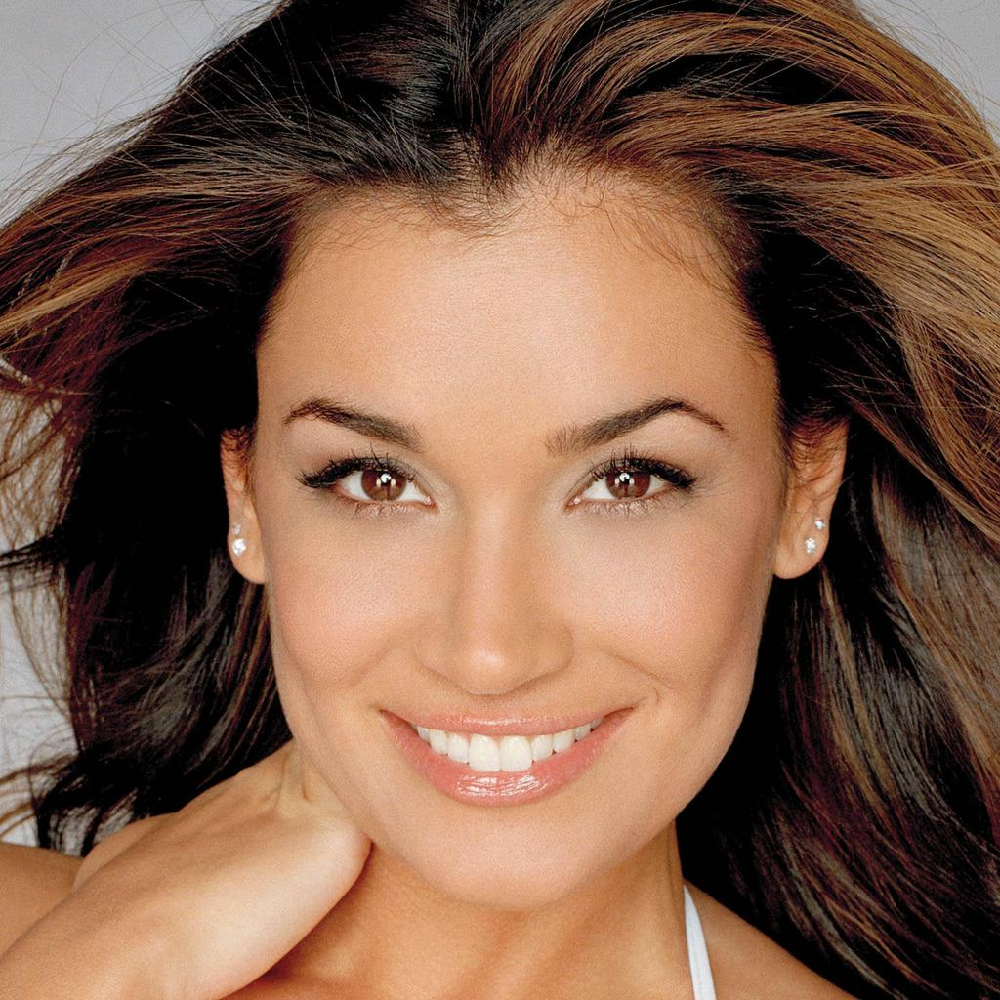

In [13]:
from PIL import Image

base_image = Image.open("/content/drive/MyDrive/539/ECE539/data/4.src.jpg")
mask_image = Image.open("/content/drive/MyDrive/539/ECE539/data/4.mask.png")

base_image

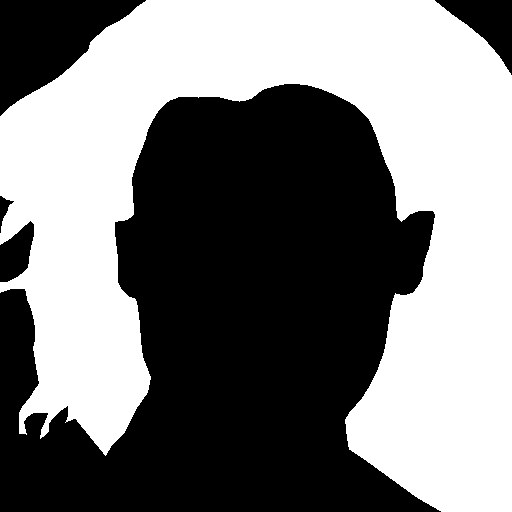

In [14]:
mask_image

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

An error occurred while trying to fetch runwayml/stable-diffusion-inpainting/vae: Error no file named diffusion_pytorch_model.safetensors found in directory runwayml/stable-diffusion-inpainting/vae.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.
An error occurred while trying to fetch runwayml/stable-diffusion-inpainting/unet: Error no file named diffusion_pytorch_model.safetensors found in directory runwayml/stable-diffusion-inpainting/unet.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.


  0%|          | 0/50 [00:00<?, ?it/s]

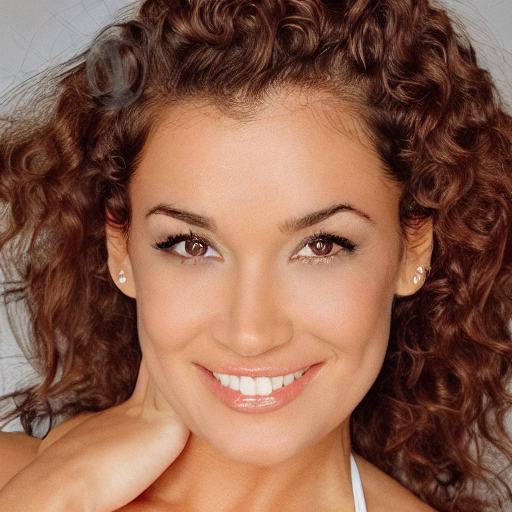

In [16]:
from diffusers import StableDiffusionInpaintPipeline, EulerAncestralDiscreteScheduler
import torch

model_id = "runwayml/stable-diffusion-inpainting"

pipe = StableDiffusionInpaintPipeline.from_pretrained(model_id, torch_dtype=torch.float16).to(
    "cuda"
)
pipe.scheduler = EulerAncestralDiscreteScheduler.from_config(pipe.scheduler.config)

# Disable safety filter
def dummy_checker(images, **kwargs): return images, False
pipe.safety_checker = dummy_checker
pipe.safety_checker = None


prompt = "Give me curly hair hair"
torch.manual_seed(0)
image = pipe(prompt=prompt, image=base_image, mask_image=mask_image, num_inference_steps=50, guidance_scale=7).images[0]

image  # nice. diffusers are cool.

The new embeddings will be initialized from a multivariate normal distribution that has old embeddings' mean and covariance. As described in this article: https://nlp.stanford.edu/~johnhew/vocab-expansion.html. To disable this, use `mean_resizing=False`


<s1>
<s2>


  0%|          | 0/50 [00:00<?, ?it/s]

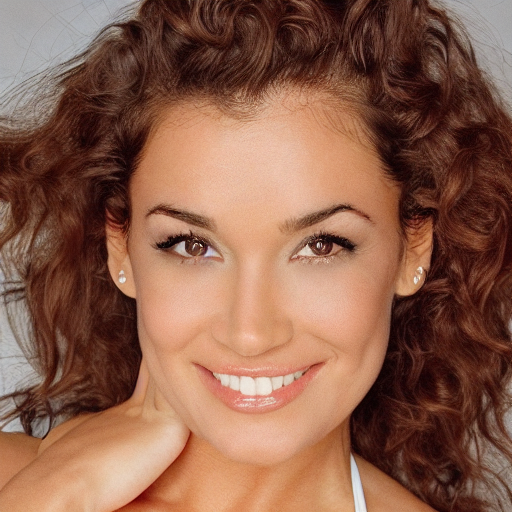

In [18]:
patch_pipe(
    pipe,
    "/content/drive/MyDrive/539/ECE539/inpaint_lora/test1.safetensors",
    patch_text=True,
    patch_ti=True,
    patch_unet=True,
)
torch.manual_seed(0)
tune_lora_scale(pipe.unet, 1.0)
tune_lora_scale(pipe.text_encoder, 1.0)
image = pipe(prompt=prompt, image=base_image, mask_image=mask_image, num_inference_steps=50, guidance_scale=5).images[0]
image


In [31]:
torch.manual_seed(6)
tune_lora_scale(pipe.unet, 0.5)
tune_lora_scale(pipe.text_encoder, 0.5)
image = pipe(prompt=prompt, image=base_image, mask_image=mask_image, num_inference_steps=50, guidance_scale=5).images[0]
image

NameError: name 'images' is not defined

In [1]:
patch_pipe(
    pipe,
    "/content/drive/MyDrive/539/ECE539/inpaint_lora/test1.safetensors",
    patch_text=True,
    patch_ti=True,
    patch_unet=True,
)

example_prompts = [
    "Give me blond hair hair",
    "Give me curly hair hair",
    "Give me short hair hair",
    "Give me black hair straight",
    "Give me black hair wavy",
    "Give me black hair curly",
    "Give me red hair wavy",
    "Give me blue hair wavy",
    "Give me bald hair",
    "Give me a fade",
    "Give me a mohawk"
]
outs = []
tune_lora_scale(pipe.unet, 0.5)
tune_lora_scale(pipe.text_encoder, 0.5)
for idx, prompt in enumerate(example_prompts):
    prompt = prompt.replace("<TOK>", "<s1><s2>")
    torch.manual_seed(idx)
    #for i in range(120):
    base_image = Image.open("/content/drive/MyDrive/539/ECE539/data/"+ 4 +".src.jpg")
    mask_image = Image.open("/content/drive/MyDrive/539/ECE539/data/"+ 4 +".mask.png")
    image = pipe(prompt=prompt, image=base_image, mask_image=mask_image, num_inference_steps=50, guidance_scale=6).images[0]
    outs.append(image)
    print(i)


NameError: name 'patch_pipe' is not defined

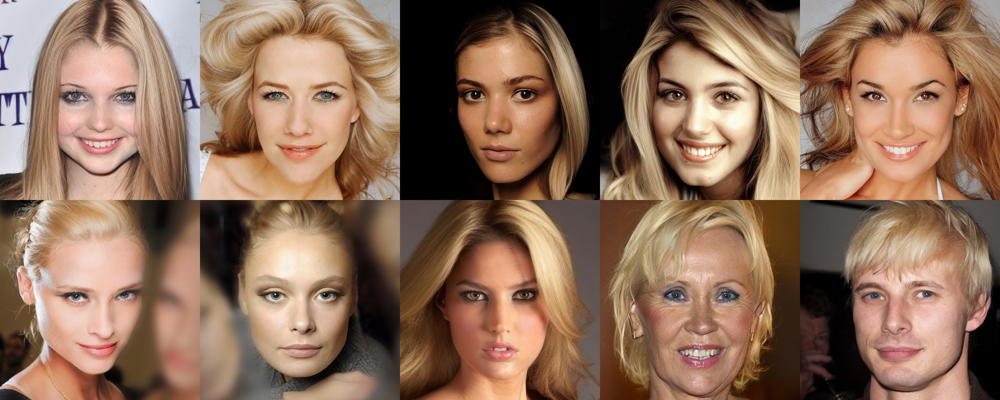

In [38]:
from lora_diffusion import image_grid
import os, datetime

today = datetime.datetime.now().strftime("%Y-%m-%d")


for idx, img in enumerate(outs):
    if not isinstance(img, Image.Image):
        raise TypeError(f"Item {idx} isn’t a PIL Image")
    img.save(os.path.join("/content/drive/MyDrive/539/ECE539/inpaint_lora/image results", f"img_{idx:04d}.png"), format="PNG")
imgs = image_grid(outs, 2, 5)
imgs